# 중간층의 출력을 시각화

In [1]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras.models import load_model
tf.compat.v1.disable_eager_execution()

model = load_model('my_model6.h5')
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_33 (Conv2D)           (None, 150, 150, 64)      640       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 75, 75, 64)        0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 75, 75, 128)       73856     
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 37, 37, 128)       0         
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 37, 37, 256)       295168    
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 18, 18, 256)       0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 18, 18, 512)      

In [2]:
img_path = 'images/mnist_num/after_process/test/5/test63.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)

(1, 150, 150, 1)


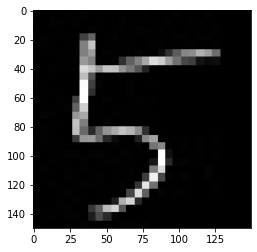

In [3]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0], cmap='gray')
plt.show()

In [4]:
from tensorflow.keras import models

layer_outputs = [layer.output for layer in model.layers[:10]]

activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [5]:
activations = activation_model.predict(img_tensor)

C:\Users\zxwlg\miniconda3\envs\dl\lib\site-packages\tensorflow\python\keras\engine\training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [6]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 150, 150, 64)


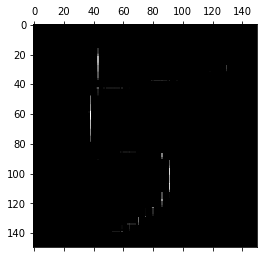

In [7]:
plt.matshow(first_layer_activation[0, :, :, 0], cmap='gray')
plt.show()

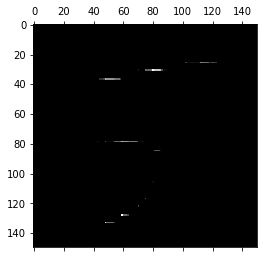

In [8]:
plt.matshow(first_layer_activation[0, :, :, 1], cmap='gray')
plt.show()

C:\Users\zxwlg\AppData\Local\Temp/ipykernel_17936/706122234.py:19: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


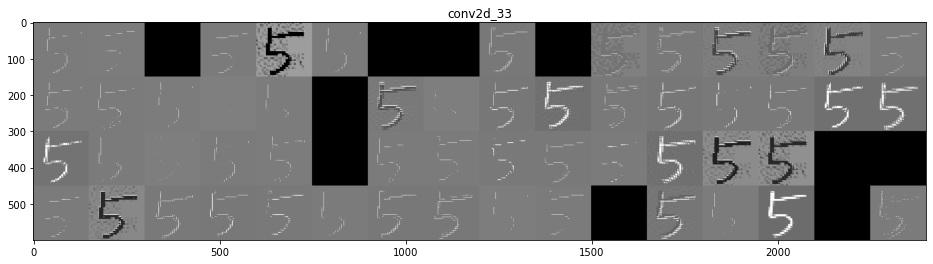

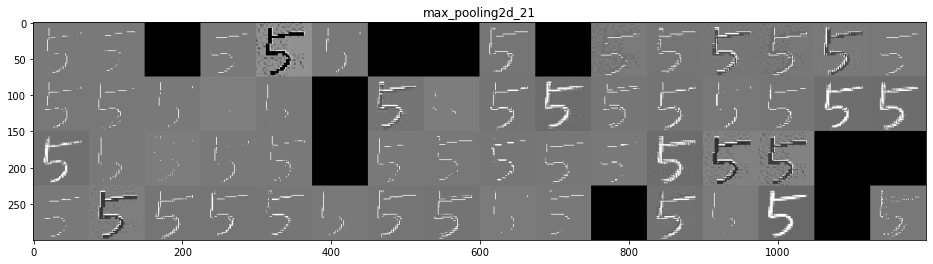

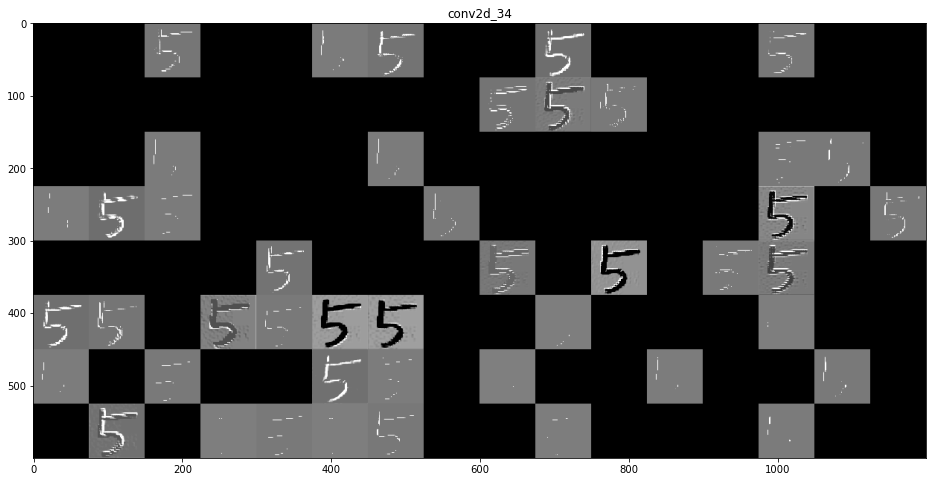

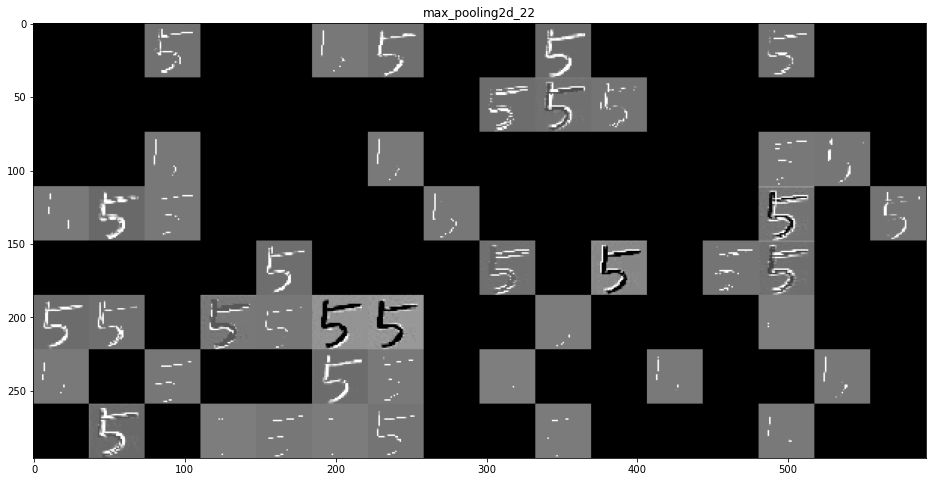

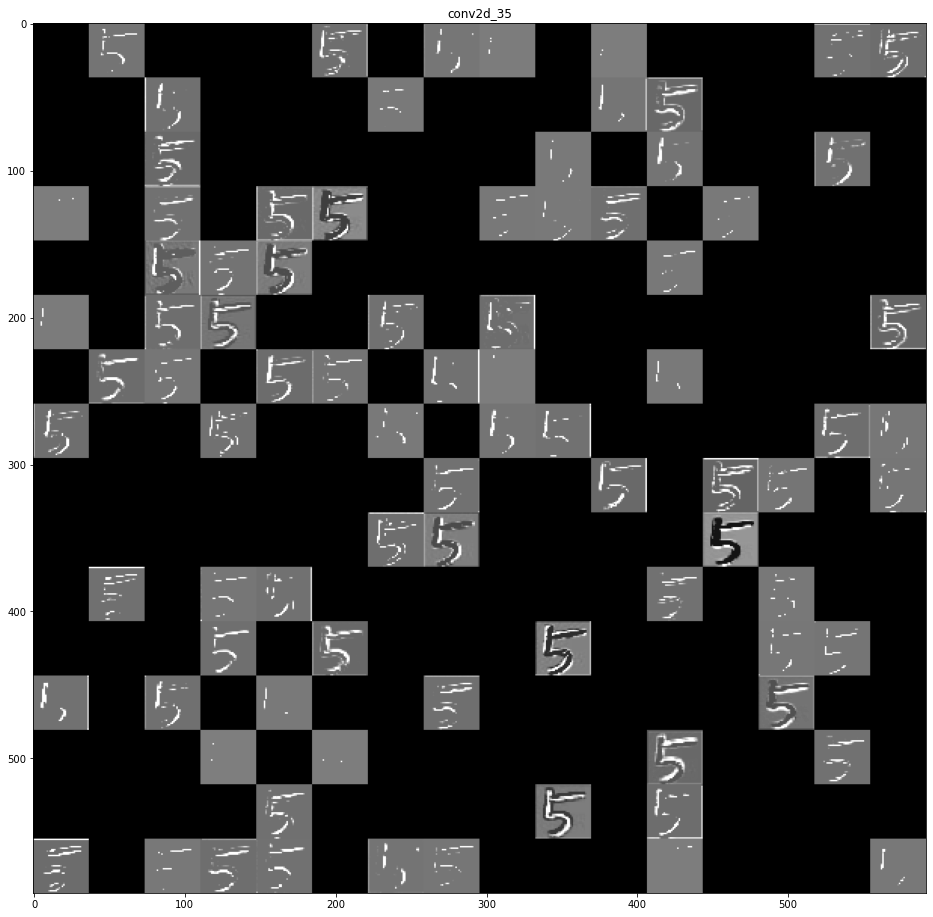

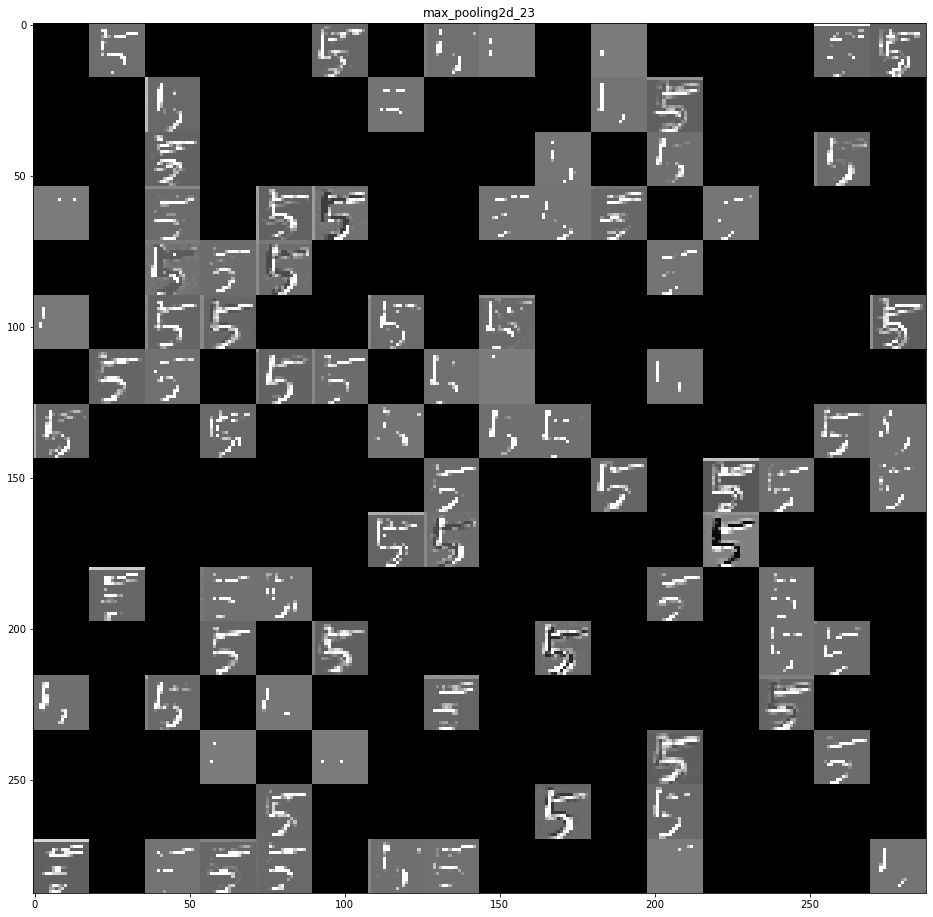

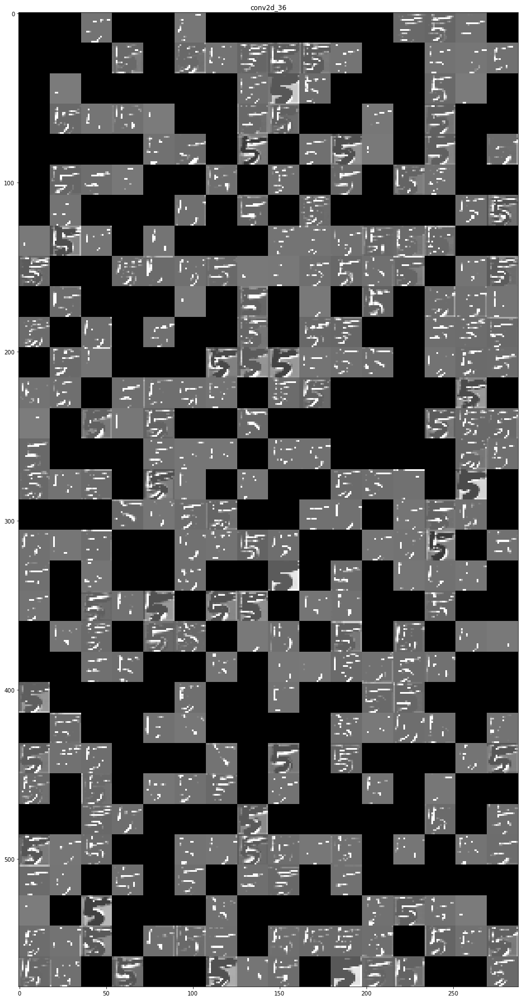

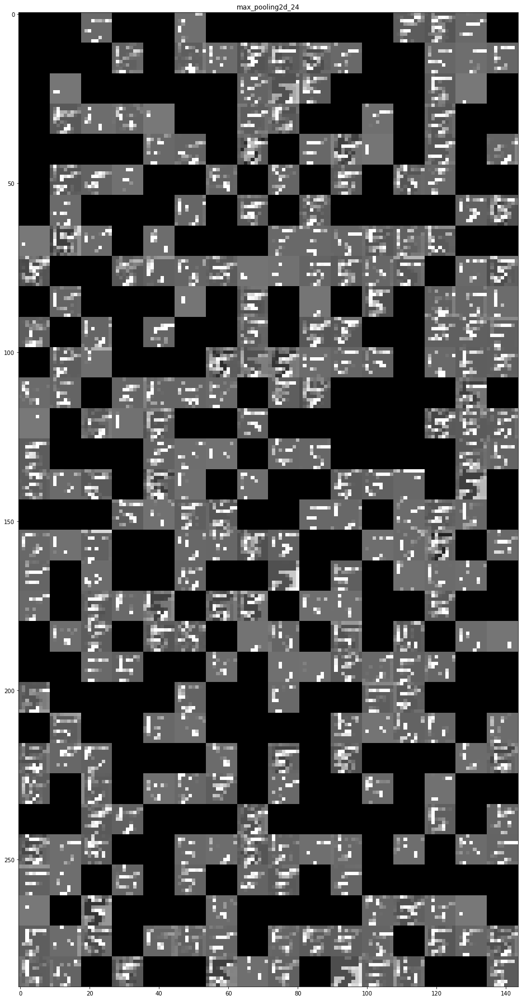

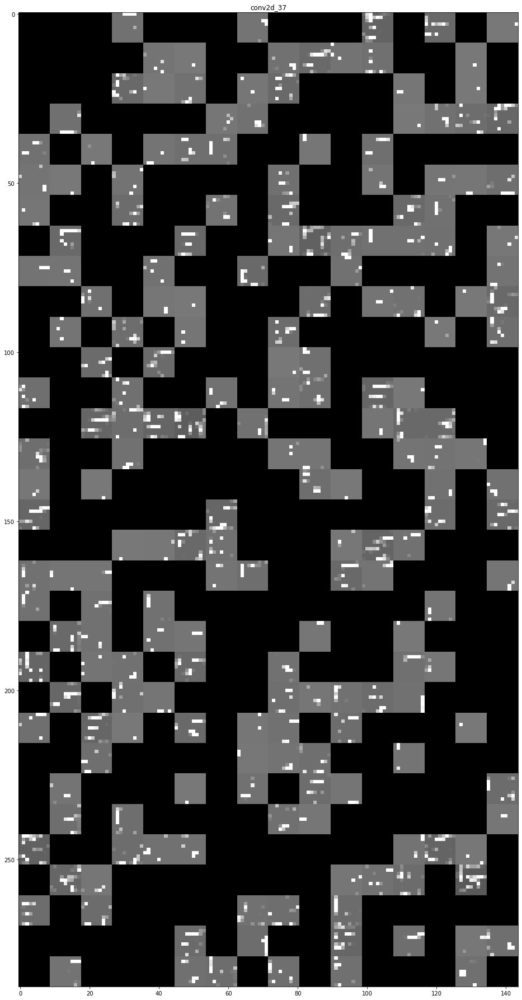

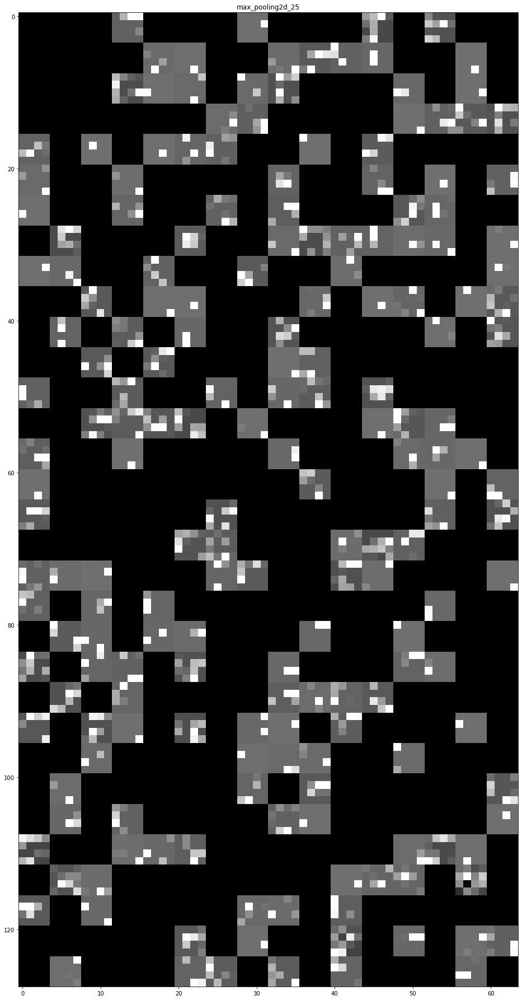

In [9]:
layer_names = []
for layer in model.layers[:10]:
    layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]

    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, size * images_per_row))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype(np.uint8)
            display_grid[col * size : (col + 1) * size, \
                         row * size : (row + 1) * size] = channel_image
    scale = 1./size
    plt.figure(figsize=(scale * display_grid.shape[1],\
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='gray')
plt.show()

# 필터를 시각화

In [10]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_33 (Conv2D)           (None, 150, 150, 64)      640       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 75, 75, 64)        0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 75, 75, 128)       73856     
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 37, 37, 128)       0         
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 37, 37, 256)       295168    
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 18, 18, 256)       0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 18, 18, 512)      

In [11]:
from tensorflow.keras import backend as K

layer_name = 'conv2d_35'
filter_index = 0
layer_output = model.get_layer(layer_name).output
with tf.GradientTape() as tape:
    loss = K.mean(layer_output[:, :, :, filter_index])

In [12]:
grads = K.gradients(loss, model.input)[0]
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

iterate = K.function([model.input], [loss, grads])

In [13]:
input_img_data = np.random.random((1, 150, 150, 1)) * 20 + 128.

step = 1.
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

In [14]:
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    x += 0.5
    x = np.clip(x, 0, 1)
    
    x *= 255
    x = np.clip(x, 0, 255).astype(np.uint8)
    return x

In [15]:
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    grads = K.gradients(loss, model.input)[0]

    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    iterate = K.function([model.input], [loss, grads])

    input_img_data = np.random.random((1, size, size, 1)) * 20 + 128.

    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    img = input_img_data[0]
    return deprocess_image(img)

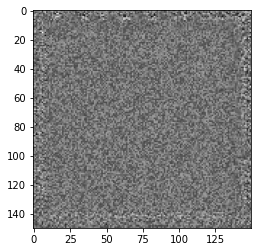

In [17]:
plt.imshow(generate_pattern('conv2d_35', 0), cmap='gray')
plt.show()

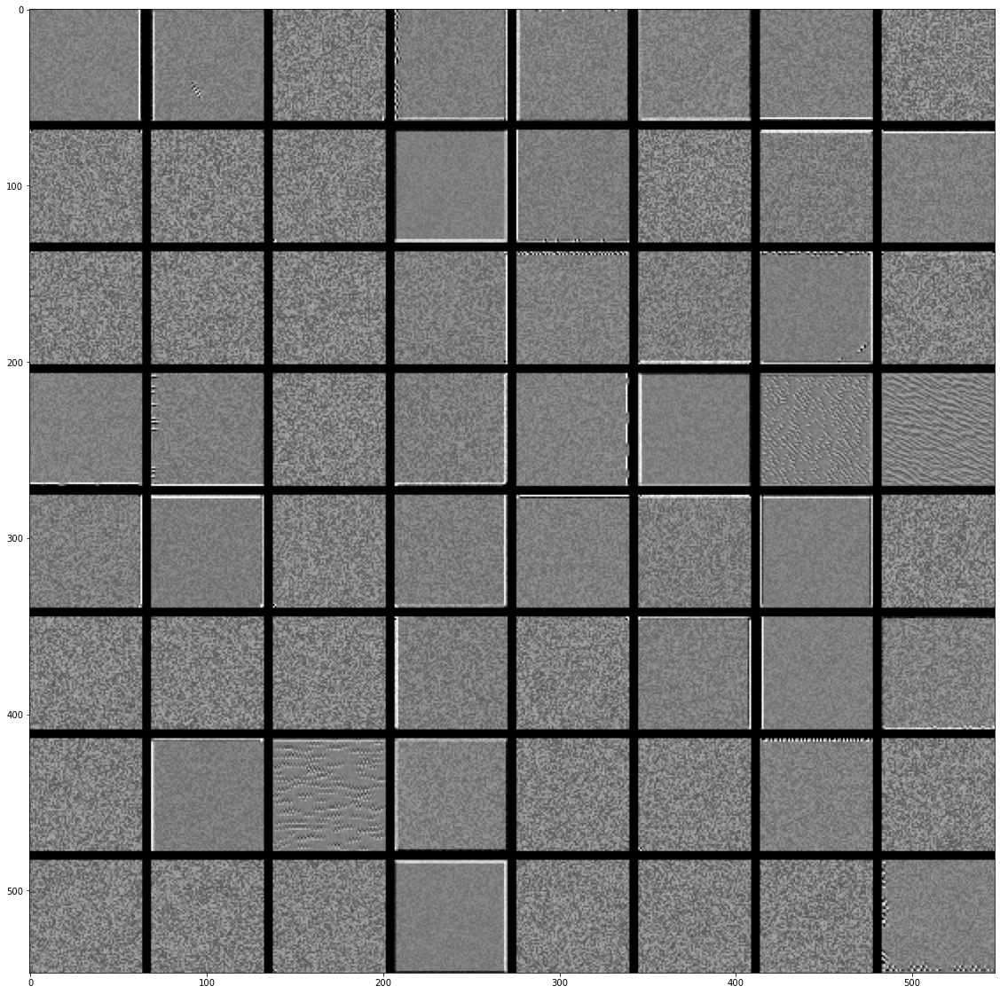

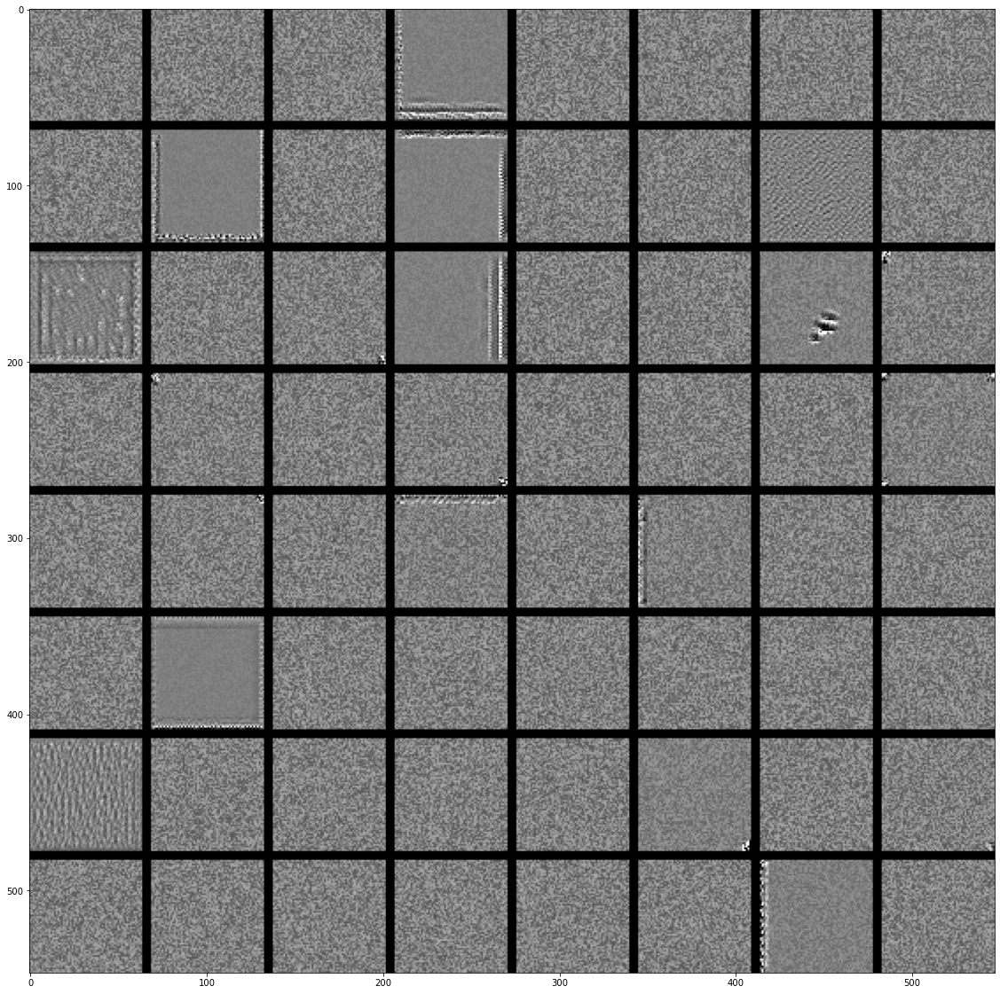

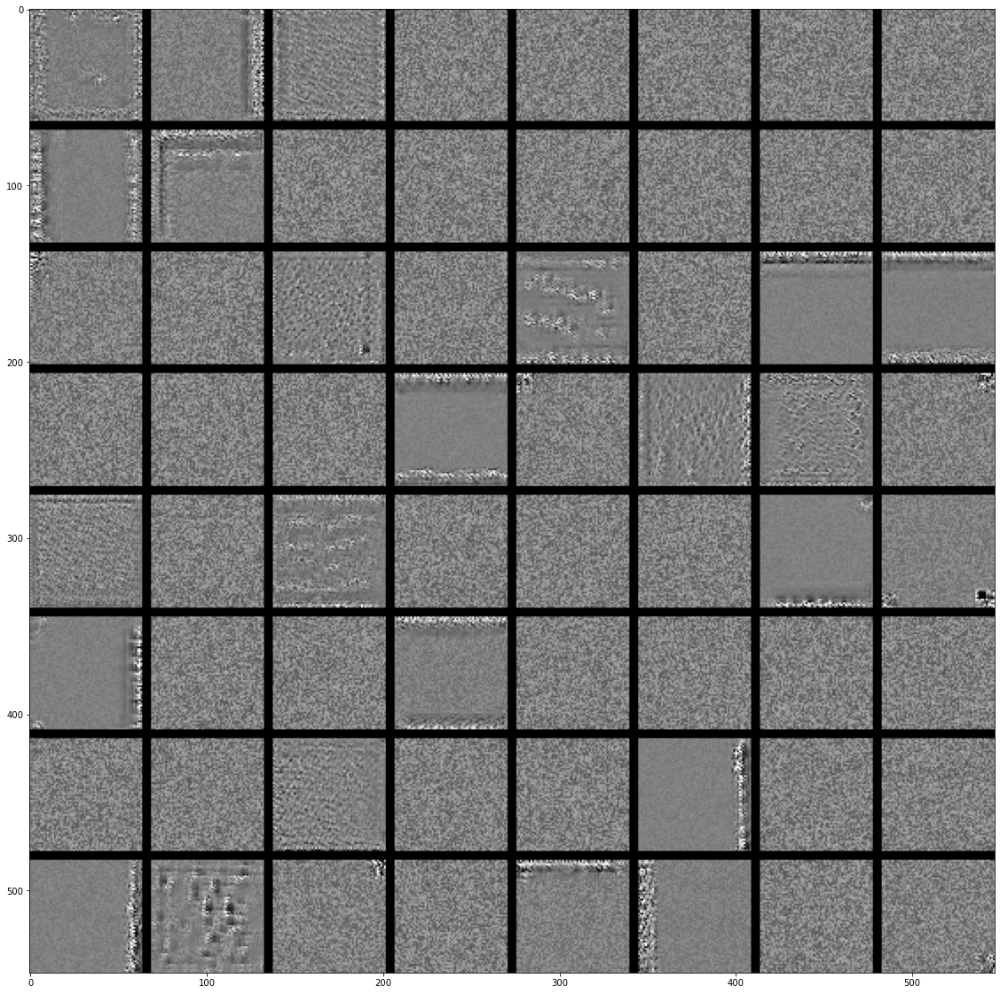

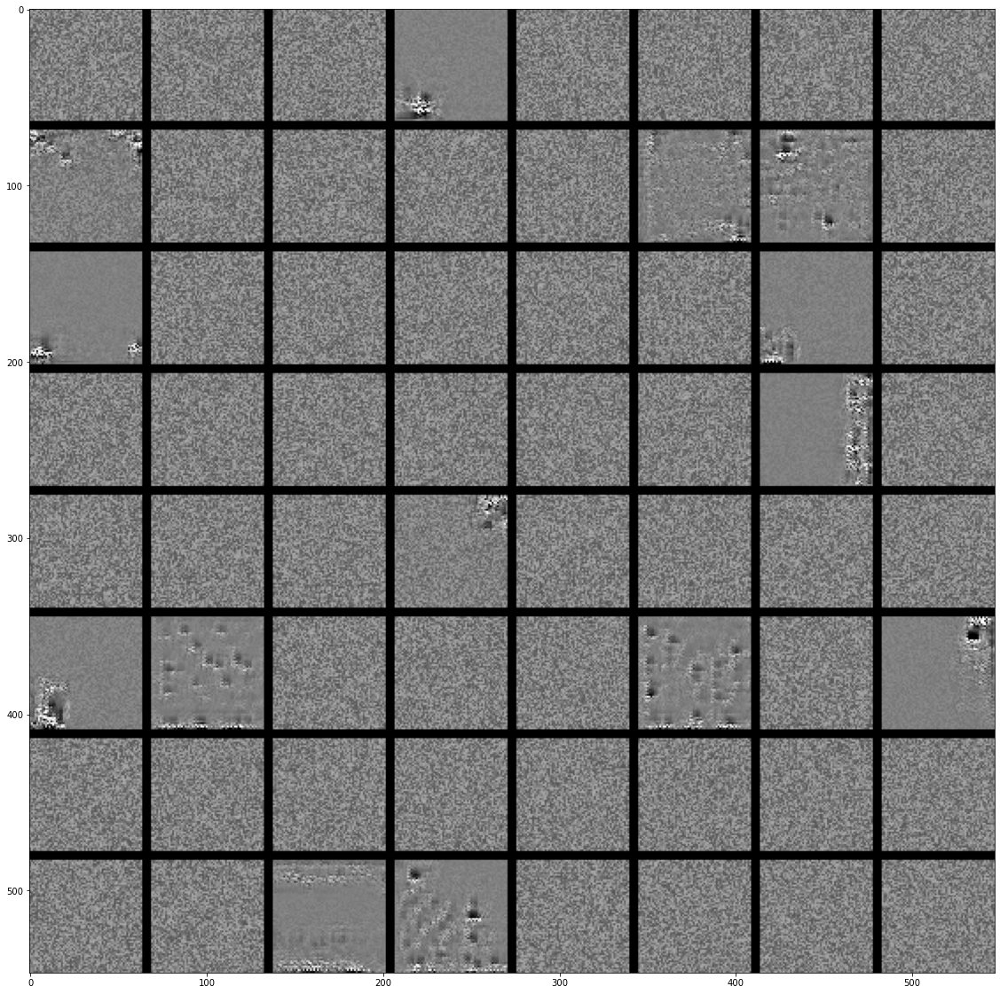

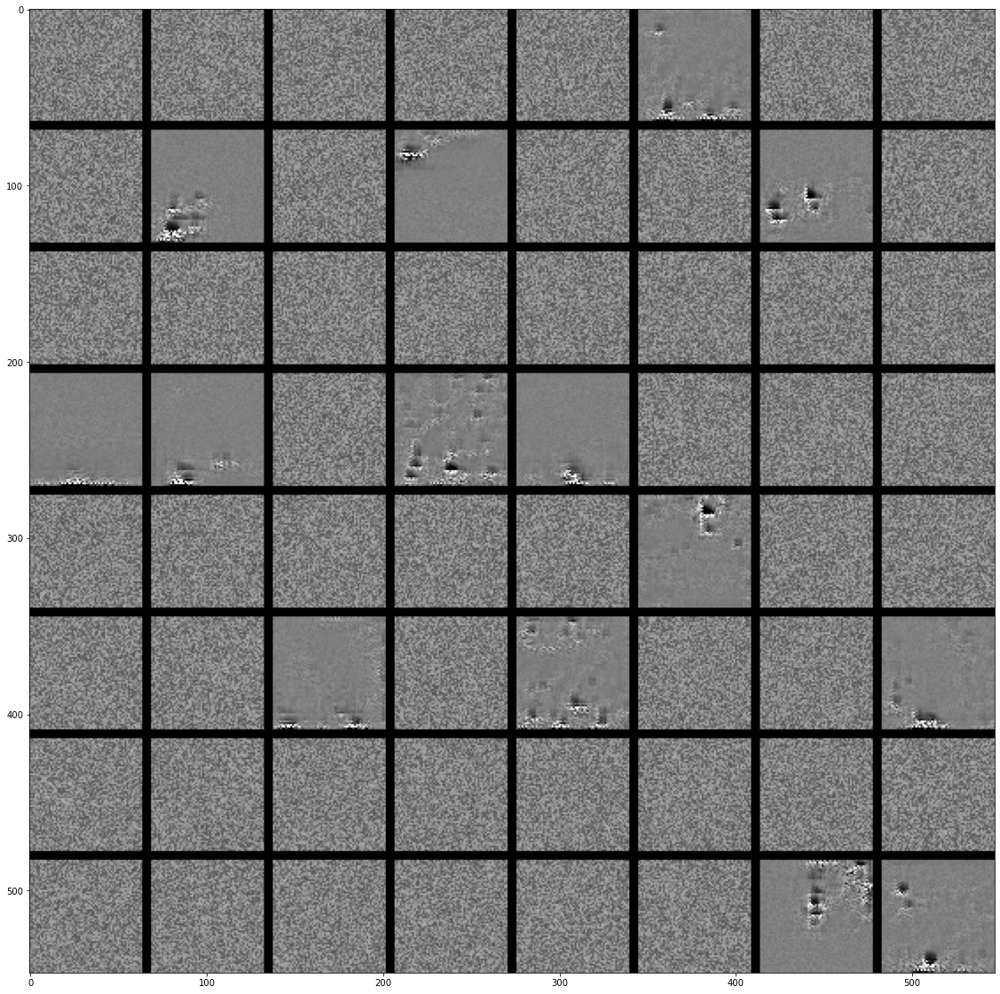

In [19]:
layer_names = ['conv2d_33', 'conv2d_34', 'conv2d_35','conv2d_36','conv2d_37']

for layer_name in layer_names:
    size = 64
    margin = 5

    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 1), dtype='uint8')

    for i in range(8):
        for j in range(8):
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start : horizontal_end, vertical_start : vertical_end, :] = filter_img

    plt.figure(figsize=(20,20))
    plt.imshow(results, cmap='gray')
    plt.show()

# 클래스 활성화에 따른 히트맵을 이미지에 시각화

## 1) - 0

(1, 150, 150, 1)


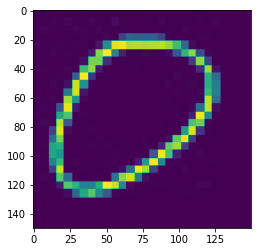

In [154]:
img_path = 'images/mnist_num/after_process/test/0/test58.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [155]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 0


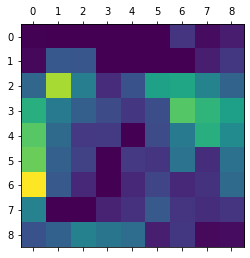

In [156]:
five_output = model.output[:, 0]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

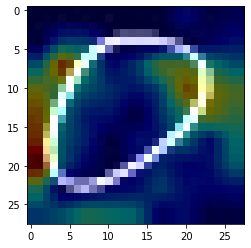

In [157]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/zero_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 2) - 1

(1, 150, 150, 1)


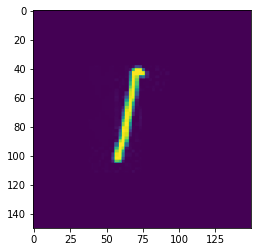

In [ ]:
img_path = 'images/mnist_num/after_process/test/1/test31.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [ ]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 1


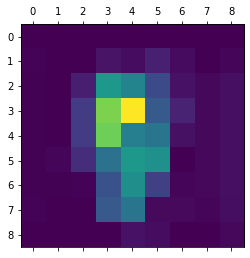

In [ ]:
five_output = model.output[:, 1]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

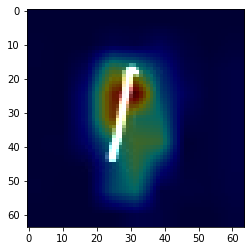

In [ ]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/one_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 3) - 2

(1, 150, 150, 1)


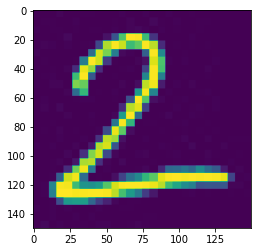

In [ ]:
img_path = 'images/mnist_num/after_process/test/2/test70.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [ ]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 2


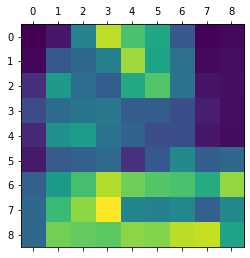

In [ ]:
five_output = model.output[:, 2]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

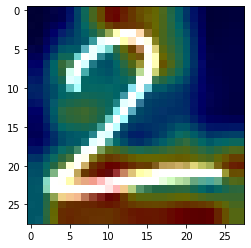

In [ ]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/two_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 4) - 3

(1, 150, 150, 1)


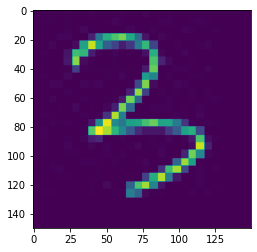

In [207]:
img_path = 'images/mnist_num/after_process/test/3/test61.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [208]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 3


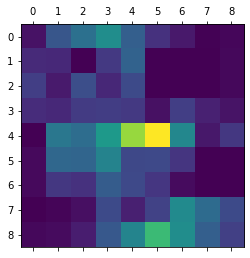

In [209]:
five_output = model.output[:, 3]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

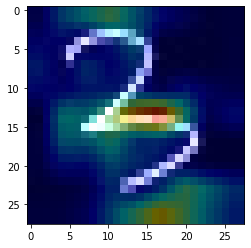

In [210]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/three_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 5) - 4

(1, 150, 150, 1)


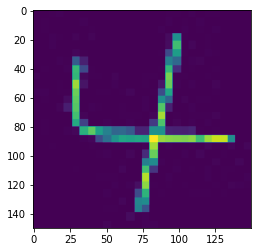

In [162]:
img_path = 'images/mnist_num/after_process/test/4/test62.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [163]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 4


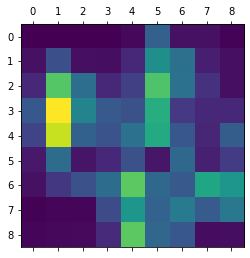

In [164]:
five_output = model.output[:, 4]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

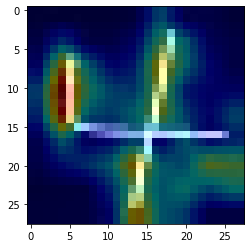

In [165]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/four_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 6) - 5

(1, 150, 150, 1)


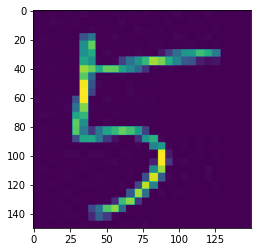

In [63]:
img_path = 'images/mnist_num/after_process/test/5/test63.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [56]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 5


In [57]:
five_output = model.output[:, 5]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)

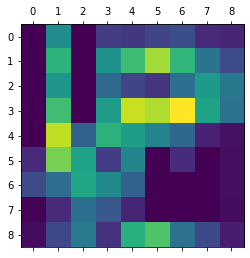

In [58]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

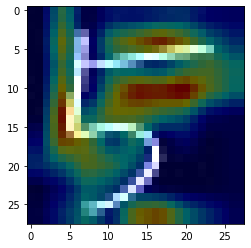

In [59]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/five_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 7) - 6

(1, 150, 150, 1)


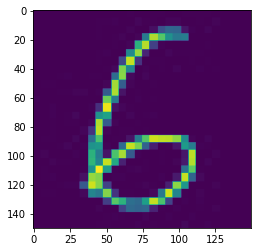

In [166]:
img_path = 'images/mnist_num/after_process/test/6/test64.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [167]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 6


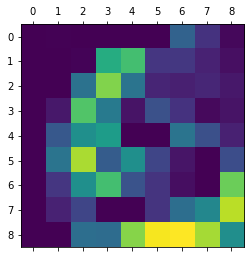

In [168]:
five_output = model.output[:, 6]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

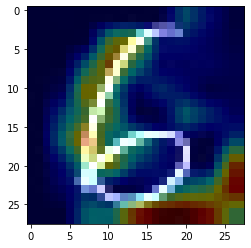

In [169]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/six_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 8) - 7

(1, 150, 150, 1)


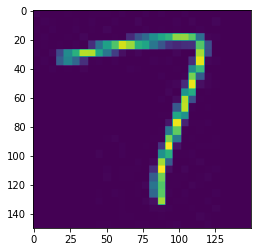

In [ ]:
img_path = 'images/mnist_num/after_process/test/7/test65.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [ ]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 7


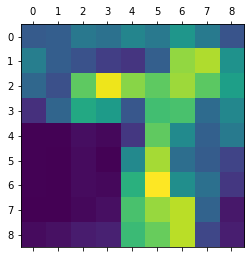

In [ ]:
five_output = model.output[:, 7]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

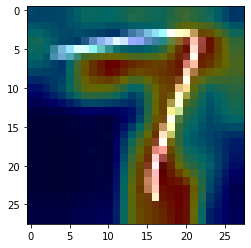

In [ ]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/seven_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 9) - 8

(1, 150, 150, 1)


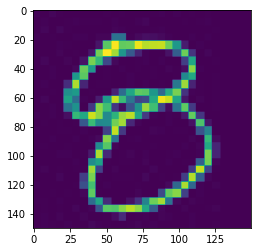

In [118]:
img_path = 'images/mnist_num/after_process/test/8/test66.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [119]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 8


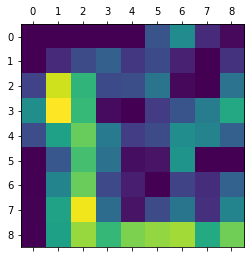

In [120]:
five_output = model.output[:, 8]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

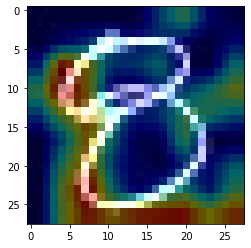

In [121]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/eight_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])

## 10) - 9

(1, 150, 150, 1)


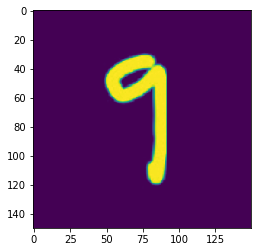

In [183]:
img_path = 'images/mnist_num/after_process/test/9/test19.jpg'
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.
img_tensor = img_tensor[:, :, :, 0].reshape((1, 150, 150, 1))
print(img_tensor.shape)
plt.imshow(img_tensor[0])

In [184]:
preds = model.predict(img_tensor)
print(f'Predict : {np.argmax(preds)}')

Predict : 9


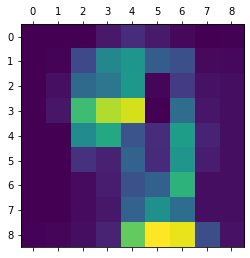

In [185]:
five_output = model.output[:, 9]

last_conv_layer = model.get_layer('conv2d_37')

grads = K.gradients(five_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

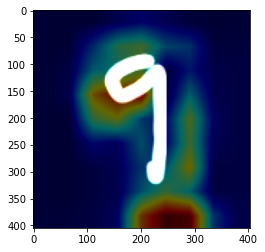

In [186]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = np.clip((heatmap * 0.4 + img), 0, 255).astype(np.uint8)

cv2.imwrite('images/nine_cam.jpg', superimposed_img)

plt.imshow(superimposed_img[:, :, ::-1])